In [1]:
%pylab inline
from ast import literal_eval
from struct import *
import numpy as np
import matplotlib.pyplot as plt
from pylab import *

Populating the interactive namespace from numpy and matplotlib


##FA Grid
####By Sergio Daniel Hernandez Charpak

Notebook to try to interact with the Fractional Anisotropy (FA) grid directly from the CIC files. 
Here we read the results and plot them.

In [2]:
def writeFirstLine(filename,line):
    with open(filename,'r+') as f:
        content = f.read()
        f.seek(0,0)
        f.write(line.rstrip('\r\n') + '\n' + content)
def readFirstLine(filename):
    with open(filename, 'r') as f:
        first_line = f.readline()
        return first_line

The next function reads the eigenvalues

In [3]:
def read_CIC_scalar(filename):
    f = open(filename, "rb")
    dumb = f.read(38)

    dumb = f.read(4)
    n_x = f.read(4)
    n_y = f.read(4)
    n_z = f.read(4)
    nodes = f.read(8)
    x0 = f.read(4)
    y0 = f.read(4)
    z0 = f.read(4)
    dx = f.read(4)
    dy = f.read(4)
    dz = f.read(4)
    dumb = f.read(4)

    n_x = (unpack('i', n_x))[0]
    n_y = (unpack('i', n_y))[0]
    n_z = (unpack('i', n_z))[0]
    nodes = (unpack('q', nodes))[0]
    dx = (unpack('f', dx))[0]
    dy = (unpack('f', dy))[0]
    dz = (unpack('f', dz))[0]
    x0 = (unpack('f', x0))[0]
    y0 = (unpack('f', y0))[0]
    z0 = (unpack('f', z0))[0]
    print n_x, n_y, n_z, nodes, dx, dy, dz

    total_nodes = n_x * n_y *n_z
    dumb = f.read(4)
    array_data = f.read(total_nodes*4)
    dumb = f.read(4)
    format_s = str(total_nodes)+'f'
    array_data = unpack(format_s, array_data)
    f.close()
    array_data  = np.array(array_data)
    array_data.resize(n_z,n_y,n_x)
    array_data = array_data.transpose()
    return array_data


def read_CIC_vector(filename):
    f = open(filename, "rb")
    dumb = f.read(38)

    dumb = f.read(4)
    n_x = f.read(4)
    n_y = f.read(4)
    n_z = f.read(4)
    nodes = f.read(4)
    x0 = f.read(4)
    y0 = f.read(4)
    z0 = f.read(4)
    dx = f.read(4)
    dy = f.read(4)
    dz = f.read(4)
    dumb = f.read(4)

    n_x = (unpack('i', n_x))[0]
    n_y = (unpack('i', n_y))[0]
    n_z = (unpack('i', n_z))[0]
    nodes = (unpack('i', nodes))[0]
    dx = (unpack('f', dx))[0]
    dy = (unpack('f', dy))[0]
    dz = (unpack('f', dz))[0]
    x0 = (unpack('f', x0))[0]
    y0 = (unpack('f', y0))[0]
    z0 = (unpack('f', z0))[0]
    print n_x, n_y, n_z, nodes, dx, dy, dz

    total_nodes = 3 * n_x * n_y *n_z
    dumb = f.read(4)
    array_data = f.read(total_nodes*4)
    dumb = f.read(4)
    format_s = str(total_nodes)+'f'
    array_data = unpack(format_s, array_data)
    f.close()
    array_data  = np.array(array_data)
    array_data.resize(n_z,n_y,n_x,3)
    vec = array_data[0,0,0,:]
    vec = array_data[0,0,1,:]
    array_data = array_data.transpose()
    #final shape is [3,n_x,n_y,n_z]
    return array_data


#filein="/store/04/bolshoi/V-web/clues/256/snap_190.CIC.s1.00.eigenvec_1"
def test_vector_plot():
    filein="/home/extforer/TV-Web/data/snap_136.s1.00.eigenvec_1"
    eigenvec_1 = read_CIC_vector(filein)

    x_component = eigenvec_1[0,:,:,:]
    x_component = x_component.flatten()
    x_component = np.absolute(x_component)

    print x_component.shape
    nbins = 20
    mu_bins = np.linspace(0.0,1.0,nbins)
    
    histo_mu_x, mu_x_range = np.histogram(x_component, bins=mu_bins)
    histo_mu_x = 1.0*histo_mu_x
    
    delta_x = 1.0/(1.0*nbins)
    histo_mu_x = histo_mu_x/sum(histo_mu_x)/delta_x
    print histo_mu_x, mu_x_range


    rc('text', usetex=True)
    rc('font', family='serif')

#plt.plot(mu_x_range[:-1], histo_mu_x, label="$e_{3}\cdot \hat{x}$")

    plt.plot(histo_mu_x, histo_mu_x, label="$e_{3}\cdot \hat{x}$")

    ylim([0.8, 1.2])
    xlim([0.0, 1.0])
    plt.legend(loc='upper left')
    plt.xlabel("$M_{1500}$")
    plt.ylabel("$\Phi(M_{1500})$ (Mpc$^{-3}$ mag$^{-1}$)")
    plt.savefig('BOX10909_smooth_1.0_align_e3.pdf')


def test_FA_plot(file1, file2, file3):
    eigenval1  = read_CIC_scalar(file1)
    eigenval2  = read_CIC_scalar(file2)
    eigenval3  = read_CIC_scalar(file3)

    
    FA = (eigenval1-eigenval3)**2  + (eigenval2-eigenval3)**2  + (eigenval1-eigenval2)**2 
    FA = FA/(eigenval1**2 + eigenval2**2 + eigenval3**2)
    FA = np.sqrt(FA)/np.sqrt(3.0)

    cut = FA[40,:,:]

    plt.imshow(cut.T)
    print cut.min(), cut.max()
    plt.savefig('test_FA_cut.pdf')

In [4]:
inputfolder = '../../Outputs/07_04_2016/'
inputfile_1 = 'snapshot_005.eigen_1'
inputfile_2 = 'snapshot_005.eigen_2'
inputfile_3 = 'snapshot_005.eigen_3'

Now let us get the three eigenvalues grids

In [5]:
grid_1 = read_CIC_scalar(inputfolder+inputfile_1)
grid_2 = read_CIC_scalar(inputfolder+inputfile_2)
grid_3 = read_CIC_scalar(inputfolder+inputfile_3)

256 256 256 16777216 976.5625 976.5625 976.5625
256 256 256 16777216 976.5625 976.5625 976.5625
256 256 256 16777216 976.5625 976.5625 976.5625


Now let us form the FA grid

In [6]:
FA = (grid_1-grid_3)**2  + (grid_2-grid_3)**2  + (grid_1-grid_2)**2 
FA = FA/(grid_1**2 + grid_2**2 + grid_3**2)
FA = np.sqrt(FA)/np.sqrt(3.0)

/usr/local/lib/python2.7/dist-packages/IPython/kernel/__main__.py:2: RuntimeWarning: invalid value encountered in divide
  from IPython.kernel.zmq import kernelapp as app


And the trace grid

<p> $\sum(\lambda) = \lambda_1 +\lambda_2+ \lambda_3$ </p>
<p> $\sum(\lambda) = -\nabla \cdot \overrightarrow{V} \propto \delta $ </p>

In [7]:
Trace = grid_1 + grid_2 + grid_3

min:  0.107134740824  max:  0.999999999983


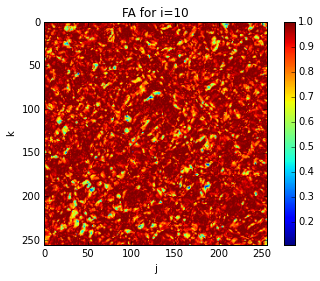

In [8]:
cut = FA[10,:,:]

plt.imshow(cut.T)
colorbar()
plt.title("FA for i=10")
plt.xlabel("j")
plt.ylabel("k")
print "min: ", cut.min()," max: ", cut.max()

min:  -3.65349468496  max:  2.85661366582


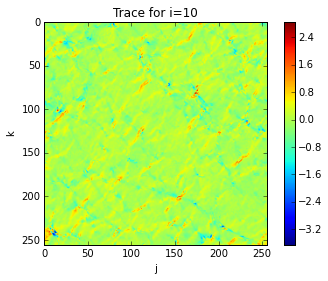

In [9]:
cut_trace = Trace[10,:,:]

plt.imshow(cut_trace.T)
plt.colorbar()
plt.title("Trace for i=10")
plt.xlabel("j")
plt.ylabel("k")
print "min: ", cut_trace.min()," max: ", cut_trace.max()

In [10]:
n_x,n_y,n_z = shape(FA)

##A Region Accretion Algorithm

In [11]:
n_grid = n_x-1 # the size of box -1, the maximum index
results = np.zeros(shape(FA)) #preps the results matrix
thresh_FA = 0.8
thresh_Trace = 0.0
thresh_FA_seeds = 0.6

<p> $\sum(\lambda) = -\nabla \cdot \overrightarrow{V} \propto \delta $ </p>

In [12]:
#Needs to pick the seeds. 
#These correspond to a highly dense FA local minima 

In [13]:
max_Trace = np.max(Trace)
min_Trace = np.min(Trace)
mean_Trace = np.mean(Trace)
std_Trace = np.std(Trace)
print max_Trace, min_Trace, mean_Trace, std_Trace

1.5448567867e+16 -5.70408835219e+14 943684991.0 3.77901569375e+12


In [14]:
Trace_thresh_list = []

In [15]:
counter_2 = 0
for i in range (n_x):
    for j in range (n_y): 
        for k in range (n_z):
            if(Trace[i,j,k]>thresh_Trace):
                counter_2+=1
                Trace_thresh_list.append([i,j,k])

In [16]:
print len(Trace_thresh_list)

8178301


In [17]:
h=0
FA_thresh_list = np.zeros(counter_2)
for i,j,k in Trace_thresh_list:
    FA_thresh_list[h] = FA[i,j,k]
    h+=1

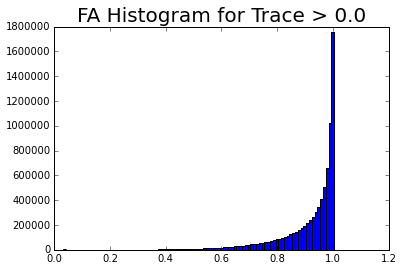

In [18]:
fig = plt.figure()
binwidth=0.01
plt.hist(FA_thresh_list, bins=np.arange(min(FA_thresh_list), max(FA_thresh_list) + binwidth, binwidth))
#plt.hist(FA_thresh_list)
#plt.xlabel('
plt.title('FA Histogram for Trace > '+str(thresh_Trace), fontsize=20)
#plt.close(fig)

In [19]:
seed_list = []

In [20]:
counter = 0
for i in range (n_x):
    for j in range (n_y): 
        for k in range (n_z):
            if((FA[i,j,k]<thresh_FA_seeds ) & (Trace[i,j,k]>thresh_Trace)):
                counter +=1
                #print Trace[i,j,k]
                #results[i,j,k] = counter
                seed_list.append([i,j,k])

In [21]:
print counter

201781


In [22]:
#Predicate to be part of the group
def predicate(i,j,k, seed_FA):
    if(results[i,j,k]==1):
        #It has already been evaluated
        #There is no need to re-evaluate the cell
        return False
    #elif( (FA[i,j,k]>=seed_FA) & (FA[i,j,k] <= thresh_FA) ):
    #elif( (FA[i,j,k] <= thresh_FA) ):
    elif( (FA[i,j,k] <= thresh_FA) & (Trace[i,j,k] >= thresh_Trace)):
        #It validates the predicate
        return True
    else:
        #It fails the predicate
        return False

In [23]:
#The algorithm, it evaluates the special cases
def region_accretion_4_neigboors(i,j,k):
    present_FA = FA[i,j,k]
    #Finds if it is on the border of the grid
    case = 0
    #Cases
    if(i==0):
        case+=1
    if(j==0):
        case+=2
    if(k==0):
        case+=4
    if(i==n_grid):
        case+=8
    if(j==n_grid):
        case+=16
    if(k==n_grid):
        case+=32
    #General case
    if(case==0):
        if(predicate(i+1,j,k,present_FA)):
            results[i+1,j,k] = 1
            region_accretion_4_neigboors(i+1,j,k)
        if(predicate(i,j+1,k,present_FA)):
            results[i,j+1,k] = 1
            region_accretion_4_neigboors(i,j+1,k)
        if(predicate(i,j,k+1,present_FA)):
            results[i,j,k+1] = 1
            region_accretion_4_neigboors(i,j,k+1)
        if(predicate(i,j-1,k,present_FA)):
            results[i,j-1,k] = 1
            region_accretion_4_neigboors(i,j-1,k)
        if(predicate(i,j,k-1,present_FA)):
            results[i,j,k-1] = 1
            region_accretion_4_neigboors(i,j,k-1)
        if(predicate(i-1,j,k,present_FA)):
            results[i-1,j,k] = 1
            region_accretion_4_neigboors(i-1,j,k)
    #Special cases
    elif(case==1):
        #face in i=0 # not a border or a corner
        if(predicate(i+1,j,k,present_FA)):
            results[i+1,j,k] = 1
            region_accretion_4_neigboors(i+1,j,k)
        if(predicate(i,j+1,k,present_FA)):
            results[i,j+1,k] = 1
            region_accretion_4_neigboors(i,j+1,k)
        if(predicate(i,j,k+1,present_FA)):
            results[i,j,k+1] = 1
            region_accretion_4_neigboors(i,j,k+1)
        if(predicate(i,j-1,k,present_FA)):
            results[i,j-1,k] = 1
            region_accretion_4_neigboors(i,j-1,k)
        if(predicate(i,j,k-1,present_FA)):
            results[i,j,k-1] = 1
            region_accretion_4_neigboors(i,j,k-1)
    
    elif(case==2):
        #face in j=0 # not a border or a corner
        if(predicate(i,j+1,k,present_FA)):
            results[i,j+1,k] = 1
            region_accretion_4_neigboors(i,j+1,k)
        if(predicate(i+1,j,k,present_FA)):
            results[i+1,j,k] = 1
            region_accretion_4_neigboors(i+1,j,k)
        if(predicate(i,j,k+1,present_FA)):
            results[i,j,k+1] = 1
            region_accretion_4_neigboors(i,j,k+1)
        if(predicate(i-1,j,k,present_FA)):
            results[i-1,j,k] = 1
            region_accretion_4_neigboors(i-1,j,k)
        if(predicate(i,j,k-1,present_FA)):
            results[i,j,k-1] = 1
            region_accretion_4_neigboors(i,j,k-1)
    
    elif(case==3):
        #border at i=0 & j=0 # not a corner 
        if(predicate(i,j+1,k,present_FA)):
            results[i,j+1,k] = 1
            region_accretion_4_neigboors(i,j+1,k)
        if(predicate(i+1,j,k,present_FA)):
            results[i+1,j,k] = 1
            region_accretion_4_neigboors(i+1,j,k)
        if(predicate(i,j,k+1,present_FA)):
            results[i,j,k+1] = 1
            region_accretion_4_neigboors(i,j,k+1)
        if(predicate(i,j,k-1,present_FA)):
            results[i,j,k-1] = 1
            region_accretion_4_neigboors(i,j,k-1)
    
    elif(case==4):
        #face in k=0 # not a border or a corner
        if(predicate(i,j+1,k,present_FA)):
            results[i,j+1,k] = 1
            region_accretion_4_neigboors(i,j+1,k)
        if(predicate(i+1,j,k,present_FA)):
            results[i+1,j,k] = 1
            region_accretion_4_neigboors(i+1,j,k)
        if(predicate(i,j,k+1,present_FA)):
            results[i,j,k+1] = 1
            region_accretion_4_neigboors(i,j,k+1)
        if(predicate(i-1,j,k,present_FA)):
            results[i-1,j,k] = 1
            region_accretion_4_neigboors(i-1,j,k)
        if(predicate(i,j-1,k,present_FA)):
            results[i,j-1,k] = 1
            region_accretion_4_neigboors(i,j-1,k)
    
    elif(case==5):
        #border at i=0 & k=0 # not a corner
        if(predicate(i,j+1,k,present_FA)):
            results[i,j+1,k] = 1
            region_accretion_4_neigboors(i,j+1,k)
        if(predicate(i+1,j,k,present_FA)):
            results[i+1,j,k] = 1
            region_accretion_4_neigboors(i+1,j,k)
        if(predicate(i,j,k+1,present_FA)):
            results[i,j,k+1] = 1
            region_accretion_4_neigboors(i,j,k+1)
        if(predicate(i,j-1,k,present_FA)):
            results[i,j-1,k] = 1
            region_accretion_4_neigboors(i,j-1,k)
    
    elif(case==6):
        #border at j=0 & k=0 # not a corner
        if(predicate(i,j+1,k,present_FA)):
            results[i,j+1,k] = 1
            region_accretion_4_neigboors(i,j+1,k)
        if(predicate(i+1,j,k,present_FA)):
            results[i+1,j,k] = 1
            region_accretion_4_neigboors(i+1,j,k)
        if(predicate(i,j,k+1,present_FA)):
            results[i,j,k+1] = 1
            region_accretion_4_neigboors(i,j,k+1)
        if(predicate(i-1,j,k,present_FA)):
            results[i-1,j,k] = 1
            region_accretion_4_neigboors(i-1,j,k)
    
    elif(case==7):
        #corner at i=0 & j=0 & k=0 
        if(predicate(i,j+1,k,present_FA)):
            results[i,j+1,k] = 1
            region_accretion_4_neigboors(i,j+1,k)
        if(predicate(i+1,j,k,present_FA)):
            results[i+1,j,k] = 1
            region_accretion_4_neigboors(i+1,j,k)
        if(predicate(i,j,k+1,present_FA)):
            results[i,j,k+1] = 1
            region_accretion_4_neigboors(i,j,k+1)
    
    elif(case==8):
        #face in i=n_grid # not a border or a corner
        if(predicate(i-1,j,k,present_FA)):
            results[i-1,j,k] = 1
            region_accretion_4_neigboors(i-1,j,k)
        if(predicate(i,j+1,k,present_FA)):
            results[i,j+1,k] = 1
            region_accretion_4_neigboors(i,j+1,k)
        if(predicate(i,j,k+1,present_FA)):
            results[i,j,k+1] = 1
            region_accretion_4_neigboors(i,j,k+1)
        if(predicate(i,j-1,k,present_FA)):
            results[i,j-1,k] = 1
            region_accretion_4_neigboors(i,j-1,k)
        if(predicate(i,j,k-1,present_FA)):
            results[i,j,k-1] = 1
            region_accretion_4_neigboors(i,j,k-1)
    
    elif(case==10):
        #border in i=n_grid & j=0
        if(predicate(i,j+1,k,present_FA)):
            results[i,j+1,k] = 1
            region_accretion_4_neigboors(i,j+1,k)
        if(predicate(i-1,j,k,present_FA)):
            results[i-1,j,k] = 1
            region_accretion_4_neigboors(i-1,j,k)
        if(predicate(i,j,k+1,present_FA)):
            results[i,j,k+1] = 1
            region_accretion_4_neigboors(i,j,k+1)
        if(predicate(i,j,k-1,present_FA)):
            results[i,j,k-1] = 1
            region_accretion_4_neigboors(i,j,k-1)
    
    elif(case==12):
        #border i=n_grid & k=0
        if(predicate(i,j+1,k,present_FA)):
            results[i,j+1,k] = 1
            region_accretion_4_neigboors(i,j+1,k)
        if(predicate(i-1,j,k,present_FA)):
            results[i-1,j,k] = 1
            region_accretion_4_neigboors(i-1,j,k)
        if(predicate(i,j,k+1,present_FA)):
            results[i,j,k+1] = 1
            region_accretion_4_neigboors(i,j,k+1)
        if(predicate(i,j-1,k,present_FA)):
            results[i,j-1,k] = 1
            region_accretion_4_neigboors(i,j-1,k) 
    
    elif(case==14):
        # corner at i=n_grid & k=0 & j=0
        if(predicate(i,j+1,k,present_FA)):
            results[i,j+1,k] = 1
            region_accretion_4_neigboors(i,j+1,k)
        if(predicate(i-1,j,k,present_FA)):
            results[i-1,j,k] = 1
            region_accretion_4_neigboors(i-1,j,k)
        if(predicate(i,j,k+1,present_FA)):
            results[i,j,k+1] = 1
            region_accretion_4_neigboors(i,j,k+1)
    
    elif(case==16):
        #face in j=n_grid # not a border or a corner
        if(predicate(i-1,j,k,present_FA)):
            results[i-1,j,k] = 1
            region_accretion_4_neigboors(i-1,j,k)
        if(predicate(i+1,j,k,present_FA)):
            results[i+1,j,k] = 1
            region_accretion_4_neigboors(i+1,j,k)
        if(predicate(i,j,k+1,present_FA)):
            results[i,j,k+1] = 1
            region_accretion_4_neigboors(i,j,k+1)
        if(predicate(i,j-1,k,present_FA)):
            results[i,j-1,k] = 1
            region_accretion_4_neigboors(i,j-1,k)
        if(predicate(i,j,k-1,present_FA)):
            results[i,j,k-1] = 1
            region_accretion_4_neigboors(i,j,k-1)
    
    elif(case==17):
        #border j=n_grid & i=0
        if(predicate(i,j,k-1,present_FA)):
            results[i,j,k-1] = 1
            region_accretion_4_neigboors(i,j,k-1)
        if(predicate(i+1,j,k,present_FA)):
            results[i+1,j,k] = 1
            region_accretion_4_neigboors(i+1,j,k)
        if(predicate(i,j,k+1,present_FA)):
            results[i,j,k+1] = 1
            region_accretion_4_neigboors(i,j,k+1)
        if(predicate(i,j-1,k,present_FA)):
            results[i,j-1,k] = 1
            region_accretion_4_neigboors(i,j-1,k)
        
    elif(case==20):
        #border j=n_grid & k=0
        if(predicate(i-1,j,k,present_FA)):
            results[i-1,j,k] = 1
            region_accretion_4_neigboors(i-1,j,k)
        if(predicate(i+1,j,k,present_FA)):
            results[i+1,j,k] = 1
            region_accretion_4_neigboors(i+1,j,k)
        if(predicate(i,j,k+1,present_FA)):
            results[i,j,k+1] = 1
            region_accretion_4_neigboors(i,j,k+1)
        if(predicate(i,j-1,k,present_FA)):
            results[i,j-1,k] = 1
            region_accretion_4_neigboors(i,j-1,k)
    
    elif(case==21):
        #corner j=n_grid & k=0 & i=0
        if(predicate(i,j-1,k,present_FA)):
            results[i,j-1,k] = 1
            region_accretion_4_neigboors(i,j-1,k)
        if(predicate(i+1,j,k,present_FA)):
            results[i+1,j,k] = 1
            region_accretion_4_neigboors(i+1,j,k)
        if(predicate(i,j,k+1,present_FA)):
            results[i,j,k+1] = 1
            region_accretion_4_neigboors(i,j,k+1)
    
    elif(case==24):
        #border j=n_grid & i=n_grid
        if(predicate(i-1,j,k,present_FA)):
            results[i-1,j,k] = 1
            region_accretion_4_neigboors(i-1,j,k)
        if(predicate(i,j,k-1,present_FA)):
            results[i,j,k-1] = 1
            region_accretion_4_neigboors(i,j,k-1)
        if(predicate(i,j,k+1,present_FA)):
            results[i,j,k+1] = 1
            region_accretion_4_neigboors(i,j,k+1)
        if(predicate(i,j-1,k,present_FA)):
            results[i,j-1,k] = 1
            region_accretion_4_neigboors(i,j-1,k)
    
    elif(case==28):
        #corner j=n_grid & k=0 & i=n_grid
        if(predicate(i,j-1,k,present_FA)):
            results[i,j-1,k] = 1
            region_accretion_4_neigboors(i,j-1,k)
        if(predicate(i-1,j,k,present_FA)):
            results[i-1,j,k] = 1
            region_accretion_4_neigboors(i-1,j,k)
        if(predicate(i,j,k+1,present_FA)):
            results[i,j,k+1] = 1
            region_accretion_4_neigboors(i,j,k+1)
    
    elif(case==32):
        #face in k=n_grid # not a border or a corner
        if(predicate(i-1,j,k,present_FA)):
            results[i-1,j,k] = 1
            region_accretion_4_neigboors(i-1,j,k)
        if(predicate(i+1,j,k,present_FA)):
            results[i+1,j,k] = 1
            region_accretion_4_neigboors(i+1,j,k)
        if(predicate(i,j+1,k,present_FA)):
            results[i,j+1,k] = 1
            region_accretion_4_neigboors(i,j+1,k)
        if(predicate(i,j-1,k,present_FA)):
            results[i,j-1,k] = 1
            region_accretion_4_neigboors(i,j-1,k)
        if(predicate(i,j,k-1,present_FA)):
            results[i,j,k-1] = 1
            region_accretion_4_neigboors(i,j,k-1)
    
    elif(case==33):
        #border k=n_grid & i=0
        if(predicate(i,j,k-1,present_FA)):
            results[i,j,k-1] = 1
            region_accretion_4_neigboors(i,j,k-1)
        if(predicate(i+1,j,k,present_FA)):
            results[i+1,j,k] = 1
            region_accretion_4_neigboors(i+1,j,k)
        if(predicate(i,j+1,k,present_FA)):
            results[i,j+1,k] = 1
            region_accretion_4_neigboors(i,j+1,k)
        if(predicate(i,j-1,k,present_FA)):
            results[i,j-1,k] = 1
            region_accretion_4_neigboors(i,j-1,k)
    
    elif(case==34):
        #border k=n_grid & j=0
        if(predicate(i,j,k-1,present_FA)):
            results[i,j,k-1] = 1
            region_accretion_4_neigboors(i,j,k-1)
        if(predicate(i+1,j,k,present_FA)):
            results[i+1,j,k] = 1
            region_accretion_4_neigboors(i+1,j,k)
        if(predicate(i,j+1,k,present_FA)):
            results[i,j+1,k] = 1
            region_accretion_4_neigboors(i,j+1,k)
        if(predicate(i-1,j,k,present_FA)):
            results[i-1,j,k] = 1
            region_accretion_4_neigboors(i-1,j,k)
    
    elif(case==35):
        #corner at k=n_grid & j=0 & i=0
        if(predicate(i,j+1,k,present_FA)):
            results[i,j+1,k] = 1
            region_accretion_4_neigboors(i,j+1,k)
        if(predicate(i+1,j,k,present_FA)):
            results[i+1,j,k] = 1
            region_accretion_4_neigboors(i+1,j,k)
        if(predicate(i,j,k-1,present_FA)):
            results[i,j,k-1] = 1
            region_accretion_4_neigboors(i,j,k-1)
    
    elif(case==40):
        #border k=n_grid & i=n_grid
        if(predicate(i,j,k-1,present_FA)):
            results[i,j,k-1] = 1
            region_accretion_4_neigboors(i,j,k-1)
        if(predicate(i,j-1,k,present_FA)):
            results[i,j-1,k] = 1
            region_accretion_4_neigboors(i,j-1,k)
        if(predicate(i,j+1,k,present_FA)):
            results[i,j+1,k] = 1
            region_accretion_4_neigboors(i,j+1,k)
        if(predicate(i-1,j,k,present_FA)):
            results[i-1,j,k] = 1
            region_accretion_4_neigboors(i-1,j,k)
    
    elif(case==42):
        #corner at k=n_grid & j=0 & i=n_grid
        if(predicate(i,j+1,k,present_FA)):
            results[i,j+1,k] = 1
            region_accretion_4_neigboors(i,j+1,k)
        if(predicate(i-1,j,k,present_FA)):
            results[i-1,j,k] = 1
            region_accretion_4_neigboors(i-1,j,k)
        if(predicate(i,j,k-1,present_FA)):
            results[i,j,k-1] = 1
            region_accretion_4_neigboors(i,j,k-1)
    
    elif(case==48):
        #border k=n_grid & j=n_grid
        if(predicate(i,j,k-1,present_FA)):
            results[i,j,k-1] = 1
            region_accretion_4_neigboors(i,j,k-1)
        if(predicate(i,j-1,k,present_FA)):
            results[i,j-1,k] = 1
            region_accretion_4_neigboors(i,j-1,k)
        if(predicate(i+1,j,k,present_FA)):
            results[i+1,j,k] = 1
            region_accretion_4_neigboors(i+1,j,k)
        if(predicate(i-1,j,k,present_FA)):
            results[i-1,j,k] = 1
            region_accretion_4_neigboors(i-1,j,k)
    
    elif(case==49):
        #corner at k=n_grid & j=n_grid & i=0
        if(predicate(i,j-1,k,present_FA)):
            results[i,j-1,k] = 1
            region_accretion_4_neigboors(i,j-1,k)
        if(predicate(i+1,j,k,present_FA)):
            results[i+1,j,k] = 1
            region_accretion_4_neigboors(i+1,j,k)
        if(predicate(i,j,k-1,present_FA)):
            results[i,j,k-1] = 1
            region_accretion_4_neigboors(i,j,k-1)
    
    elif(case==56):
        #corner at k=n_grid & j=n_grid & i=n_grid
        if(predicate(i,j-1,k,present_FA)):
            results[i,j-1,k] = 1
            region_accretion_4_neigboors(i,j-1,k)
        if(predicate(i-1,j,k,present_FA)):
            results[i-1,j,k] = 1
            region_accretion_4_neigboors(i-1,j,k)
        if(predicate(i,j,k-1,present_FA)):
            results[i,j,k-1] = 1
            region_accretion_4_neigboors(i,j,k-1)
    else:
        #it is one of the impossible cases
        print "There is an error for [i,jk]: [" +str(i)+","+str(j)+","+str(k)+"]"
        print "The case encountered was: "+str(case)

In [24]:
n_grid = n_x-1 # the size of box -1, the maximum index
results = np.zeros(shape(FA)) #preps the results matrix
thresh_FA = 0.8
thresh_Trace = 0.0
thresh_FA_seeds = 0.6

<p>Setting a higher recursion limit</p>
<p>Apparently it is risky to higher it </p>
https://docs.python.org/2/library/sys.html#sys.setrecursionlimit

In [25]:
import sys
sys.setrecursionlimit(10000)

In [26]:
for (i,j,k) in seed_list:
    region_accretion_4_neigboors(i,j,k)

In [29]:
results_list = []
results_x = []
results_y = []
results_z = []
counter_results = 0
for i in range (n_x):
    for j in range (n_y): 
        for k in range (n_z):
            if(results[i,j,k]>0.0):
                counter_results+=1
                results_list.append([i,j,k])
                results_x.append(i)
                results_y.append(j)
                results_z.append(k)

In [30]:
print counter_results
print counter

958949
201781


In [31]:
from mpl_toolkits.mplot3d import Axes3D

In [35]:
#plt.close(fig)

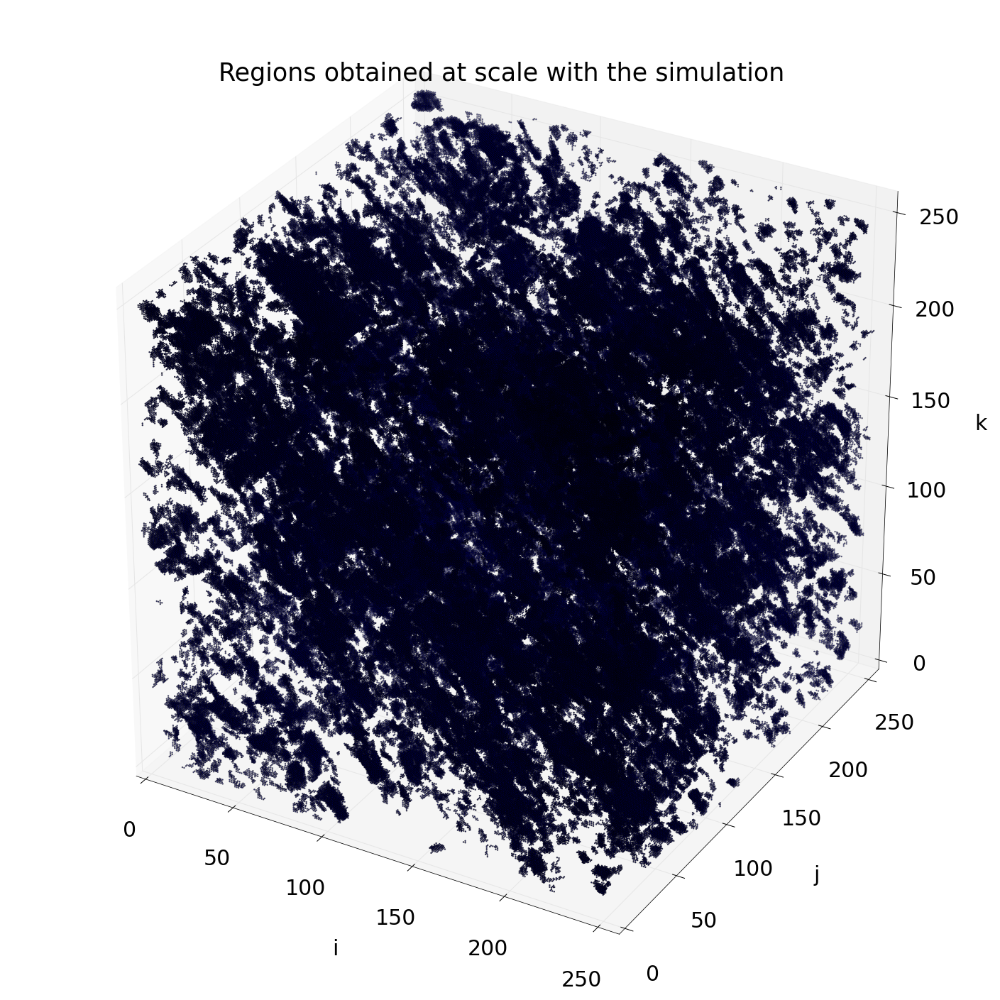

In [36]:
fig = plt.figure(figsize=(25, 25))
ax = fig.add_subplot(111, projection='3d')
#ax.plot(line_x, line_y, line_z, color = 'r')
ax.scatter(results_x,results_y,results_z,s=2)
ax.set_xlim3d(0, 256)
ax.set_ylim3d(0, 256)
ax.set_zlim3d(0, 256)
ax.set_xlabel('i', size=30)
ax.set_ylabel('j', size=30)
ax.set_zlabel('k', size=30)
ax.set_title('Regions obtained at scale with the simulation', size=35)
ax.tick_params(axis='both', which='major', labelsize=30)
#plt.colorbar()
#plt.show()
#plt.savefig(results_path+"regions_big.png",format = 'png')
#plt.close(fig)

min:  0.0  max:  1.0


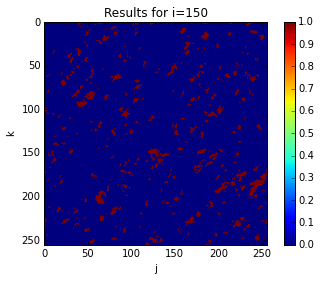

In [43]:
cut = results[150,:,:]

plt.imshow(cut.T)
colorbar()
plt.title("Results for i=150")
plt.xlabel("j")
plt.ylabel("k")
print "min: ", cut.min()," max: ", cut.max()

/home/shernand/.local/lib/python2.7/site-packages/matplotlib/pyplot.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


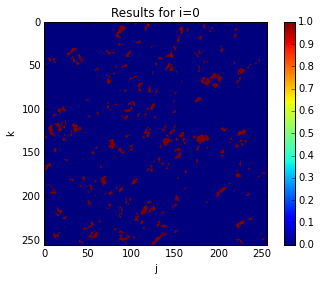

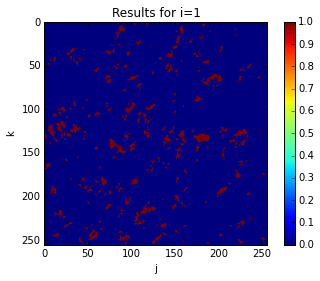

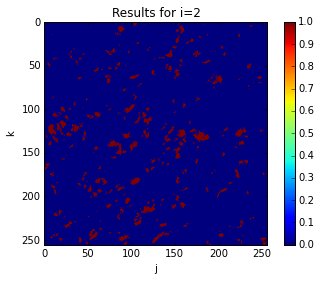

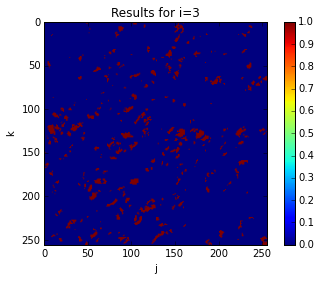

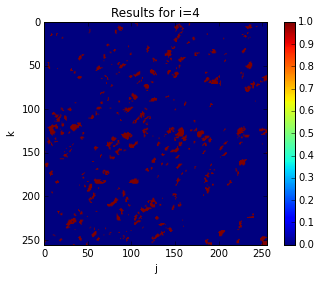

...

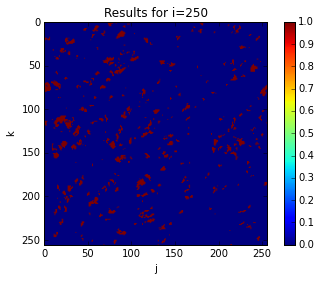

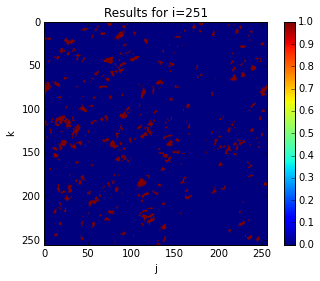

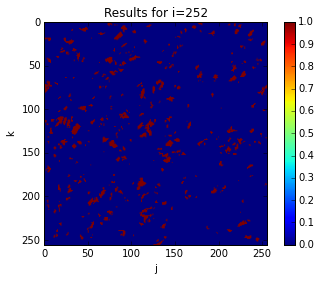

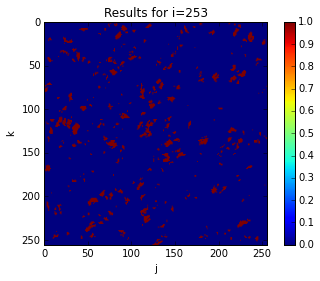

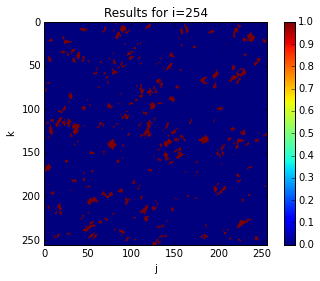

In [48]:
for i in range(n_grid):
    plt.figure()
    cut = results[i,:,:]
    plt.imshow(cut.T)
    colorbar()
    plt.title("Results for i="+str(i))
    plt.xlabel("j")
    plt.ylabel("k")
    plt.savefig("regions_"+str(i)+".png",format = 'png')
    plt.close(fig)

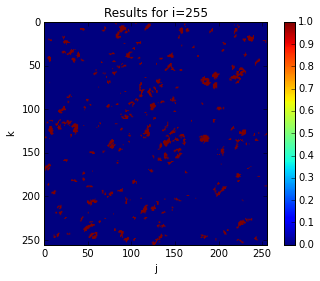

In [51]:
i=255
plt.figure()
cut = results[i,:,:]
plt.imshow(cut.T)
colorbar()
plt.title("Results for i="+str(i))
plt.xlabel("j")
plt.ylabel("k")
plt.savefig("regions_"+str(i)+".png",format = 'png')
plt.close(fig)

In [77]:
#Resize of the box
l_x_max = np.max(results_x)
l_y_max = np.max(results_y)
l_z_max = np.max(results_z)
l_x_min = np.min(results_x)
l_y_min = np.min(results_y)
l_z_min = np.min(results_z)

#Cube which has the region
line_x = [l_x_min,l_x_max, l_x_max, l_x_min, l_x_min, l_x_min, l_x_min, l_x_min, l_x_min, l_x_max, l_x_max, l_x_max, l_x_max, l_x_max, l_x_max, l_x_min]
line_y = [l_y_min,l_y_min, l_y_max, l_y_max, l_y_min, l_y_min, l_y_max, l_y_max, l_y_max, l_y_max, l_y_max, l_y_max, l_y_min, l_y_min, l_y_min, l_y_min]
line_z = [l_z_min,l_z_min, l_z_min, l_z_min, l_z_min, l_z_max, l_z_max, l_z_min, l_z_max, l_z_max, l_z_min, l_z_max, l_z_max, l_z_min, l_z_max, l_z_max]

fig = plt.figure(figsize=(25, 25))
ax = fig.add_subplot(111, projection='3d')
ax.plot(line_x, line_y, line_z, color = 'r')
ax.scatter(results_x,results_y,results_z,s=2,c='b')
ax.set_xlim3d(l_x_min, l_x_max)
ax.set_ylim3d(l_y_min,l_y_max)
ax.set_zlim3d(l_z_min,l_z_max)
ax.set_xlabel('X kpc/h', size=30)
ax.set_ylabel('Y kpc/h', size=30)
ax.set_zlabel('Z kpc/h', size=30)
ax.set_title('Regions obtained', size=35)
ax.tick_params(axis='both', which='major', labelsize=30)
#plt.savefig(results_path+"regions_small.png",format = 'png')
#plt.close(fig)

fig = plt.figure(figsize=(25, 25))
ax = fig.add_subplot(111, projection='3d')
ax.plot(line_x, line_y, line_z, color = 'r')
ax.scatter(results_list[:,0],results_list[:,1],results_list[:,2],s=20)
ax.set_xlim3d(0, 256)
ax.set_ylim3d(0, 256)
ax.set_zlim3d(0, 256)
ax.set_xlabel('X kpc/h', size=30)
ax.set_ylabel('Y kpc/h', size=30)
ax.set_zlabel('Z kpc/h', size=30)
ax.set_title('Regions obtained at scale with the simulation', size=35)
ax.tick_params(axis='both', which='major', labelsize=30)
#plt.colorbar()
#plt.show()
#plt.savefig(results_path+"regions_big.png",format = 'png')
#plt.close(fig)


TypeError: list indices must be integers, not tuple